In [7]:
import numpy as np
import pandas as pd
import sklearn
import matplotlib.pyplot as plt
from pandas.api.types import is_object_dtype
from sklearn.kernel_ridge import KernelRidge
from xgboost import plot_importance
import lightgbm as lgb
import datetime
import xgboost as xg 
import scipy.stats as stats
import seaborn as sns

## Bayesian Optimization
from bayes_opt import BayesianOptimization
from bayes_opt.logger import JSONLogger
from bayes_opt.event import Events

# Stats
from scipy.stats import skew, norm
from scipy.special import boxcox1p
from scipy.stats import boxcox_normmax

# Vorraussage Kaufpreis von Wohnobjekten

In [8]:
from helper_functions.preprocessing import preprocessor, Reducer
from helper_functions.metrics import durbin_watson,mean_absolute_percentage_error, xgb_n_mape, negative_mean_absolute_percentage_error, r2_mape

In [9]:
csv_data = pd.read_csv('immo_dev_data.csv')

# Linear Regression
Als erstes machen wir eine Lineare Regression (Ordinary least squares Linear Regression) auf AreaLiving und schauen nach, wie gut der PurchasePrice vorhergesagt ist. Als Metric benutzen wir den MAPE (Mean Absolute Percentage Error):

$$MAPE = {\frac  {1}{n}}\sum _{{t=1}}^{n}|{\frac  {A_{t}-F_{t}}{A_{t}}|}$$

$A_{t}$ ist der korrekte Preis und $F_{t}$ unser kalkulierter Preis.


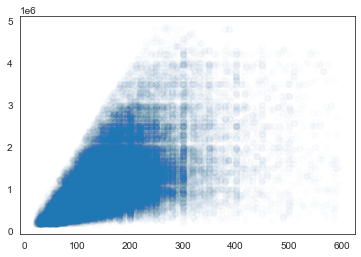

In [38]:
X = csv_data['AreaLiving'].to_numpy().reshape(-1, 1)
y = csv_data['PurchasePrice']
plt.scatter(X, y, alpha = 0.01)
plt.show()

Wir sehen schon anhand des Plots, dass die Prediction nicht gut sein wird. Es hat zuviel Varianz. Wir werden immer, falls möglich, die Daten wie folgt präprozessieren:
- den Logarithmus vom PurchasePrice nehmen um diesen besser normalverteilt zu machen.
- Onehot-Encoden: Kategorische Daten oder Strings werden Onehot-encoded. Dies bedeutet, dass ein Attribut in mehrere Attribute binär aufgeteilt wird und diese neuen Attribute sagen, ob dieser Eintrag ein String oder Kategorie enthält.
- Label-Encoden: (Gleiche) Strings werden durch (gleiche) Zahlen ersetzt.
- Standardisieren auf die Z-Score: $z=\frac{x-\mu}{\sigma}$. ($\sigma$ ist entweder die Standardabweichung oder das 75% Quantil subtrahiert vom 25% Quantil.)
- NANs auffüllen (entweder mit Mean oder Median oder mit einem bestimmten String).
- ggf. auf allen geskewten Werten eine Boxcox-Transformation durchführen, wobei dies bei unseren Test das Ergebniss nicht verbessert hat.
- 'StreetAndNr', 'LastUpdate', 'Locality', 'Id' werden gedropped; 'StreetAndNr' und 'LastUpdate' haben zuviele, einzigartige Werte und 'Locality' ist bereits im Zipcode vorhanden.
- Falls ein Attribut nur Werte zwischen 0 und 1 hat, wird ein neues Attribut kreiert, welches besagt, dass dieses Attribut 0 ist.
- Falls ein Attribut NANs hatte, wird ein neues Attribut erstellt, welches zeigt, wo ein Attribut NANs hatte.

In den Daten haben wir auch Ungereihmheiten entdeckt: 
- 2 Einträge haben oft keine Werte. (2)
- Es hat Einträge mit Etagen von über 41, dabei ist die Bar im Roche-Tower auf Etage 41 die höchste Etage der Schweiz. (739)
- Es hat Wohnobjekten mit einem Baujahr nach dem Renovationsjahr. (23)

Diese tauchen aber auch im Testset auf, welches wir für die Submission auf Kaggle benutzen müssen. Somit lassen wir diese drin, kennmarken diese aber.

Diese Prozessierung wird grössenteils mit Hilfe einer Klasse (preprocessor) durchgeführt.

In [39]:
csv_data_selected = csv_data[['PurchasePrice', 'AreaLiving']]
prepro = preprocessor(csv_data_selected, y_var='PurchasePrice')
prepro.preprocess()

In [40]:
reg = sklearn.linear_model.LinearRegression().fit(prepro.X_train, np.log(prepro.y_train))
pred = np.exp(reg.predict(prepro.X_test))
r2_mape(prepro.y_test, pred)

R2-Score: 0.09057998418283497. MAPE: 0.3555584880825077


Eine MAPE von 35% ist extrem schlecht. Wir machen eine Residuenanalyse, um zu sehen, was wir verbessern können.

## Residuen Analyse
Die Residuen werden dadurch gebildet, dass man die Differenz zwischen dem richtigen Preis und dem vorhergesagten Preis analysiert. Für eine Lineare Regression müssen folgende Punkte  erfüllt sein:

- Linearität: Die Beziehung zwischen X und dem Mittelwert von Y ist linear.
- Homoskedastizität: Die Varianz der Residuen ist für jeden Wert von X gleich.
- Unabhängigkeit: Die Beobachtungen sind unabhängig voneinander.
- Normalität: Für jeden Wert von X ist Y normalverteilt.

In [41]:
residuen = prepro.y_test - pred

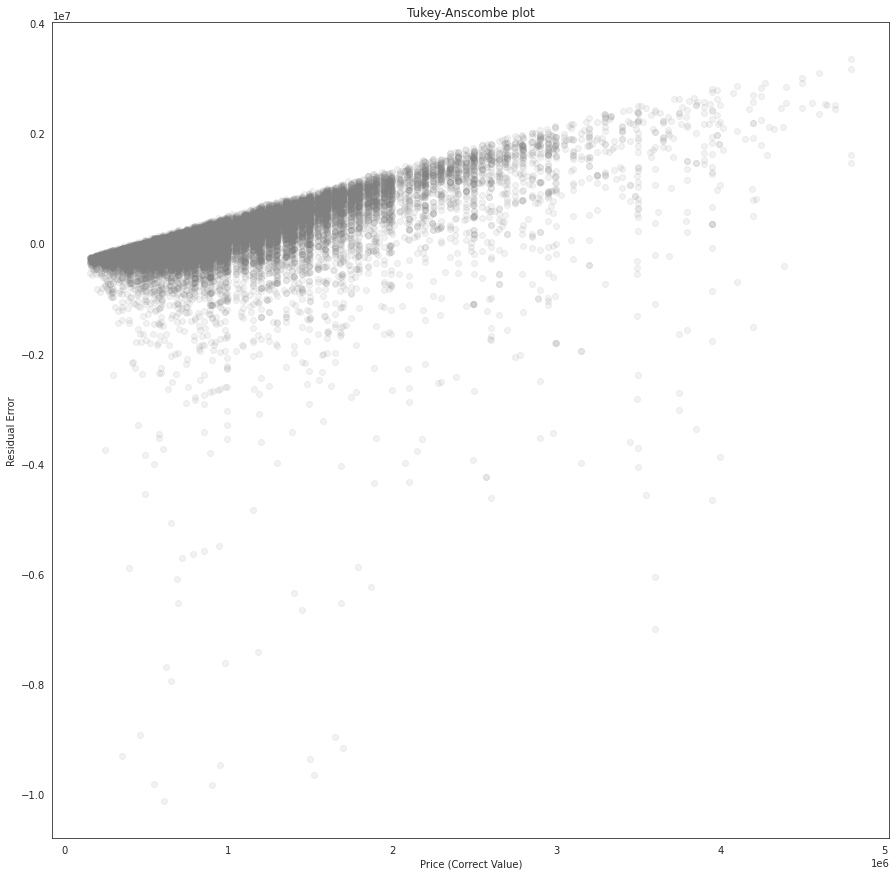

In [42]:
plt.scatter(prepro.y_test, np.array(residuen), alpha = 0.1, color = 'grey')
plt.title("Tukey-Anscombe plot")
plt.xlabel("Price (Correct Value)")
plt.ylabel("Residual Error")
plt.show()

Im oberen Plot sieht man die Residuen (y-Achse) und den richtigen Wert (x-Achse). Man sieht, dass die Residuen nicht um y=0 normalverteilt sind und das es unerklärte Varianz hat, da der Fehler mit der Zunahme des Preises grösser wird. 


 mu = 71465.82 and sigma = 546539.63



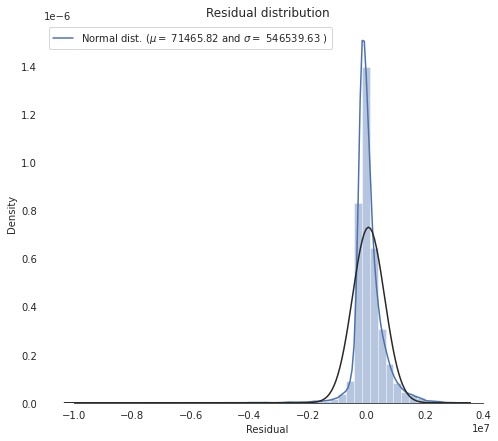

In [43]:
sns.set_style("white")
sns.set_color_codes(palette='deep')
f, ax = plt.subplots(figsize=(8, 7))
#Check the new distribution 
sns.distplot(residuen , fit=norm, color="b")

# Get the fitted parameters used by the function
(mu, sigma) = norm.fit(residuen)
print( '\n mu = {:.2f} and sigma = {:.2f}\n'.format(mu, sigma))

#Now plot the distribution
plt.legend(['Normal dist. ($\mu=$ {:.2f} and $\sigma=$ {:.2f} )'.format(mu, sigma)],
            loc='best')
ax.xaxis.grid(False)
ax.set(ylabel="Density")
ax.set(xlabel="Residual")
ax.set(title="Residual distribution")
sns.despine(trim=True, left=True)

plt.show()

Im oberen Plot sieht man noch besser, dass die Werte nicht normalverteilt sind. Natürlich lässt sich das auch mit einem QQ-Plot zeigen. Der QQ-Plot vergleicht die Quantile der Normalverteilung (x-Achse) mit den Quantilen der Residuen (y-Achse). Wären die Residuen normalverteilt, wären die Quantile gleich und würden somit eine perfekte gerade bilden.

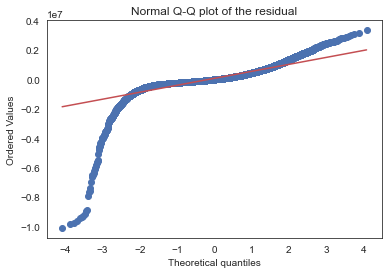

In [49]:
stats.probplot(residuen, dist="norm", plot=plt)
plt.title("Normal Q-Q plot of the residual")
plt.show()

In [48]:
durbin_watson(residuen, prepro.y_test)

1.2383109383385777

Man kann anhand Durbin Watson sehen, dass es eine positive Autokorrelation hat (also die Residuen, sortiert nach dem richtigen Preis, haben eine Autokorrelation), dass die Varianz also zunimmt mit "Area Living". Wäre der Wert um 2, wären die Residuen perfekt unkorreliert.

Wir können mit einem Linearen Modell also nicht die Varianz komplett erklären. Wir versuchen also nun mehr Varianz mit 
zusätzlichen Attributen zu erklären; Wir fügen Zip-Nummer (durch 100 geteilt und runter-gerundet) Onehot-encoded dazu.

In [20]:
csv_data_zip_price_transformed = csv_data.copy()
csv_data_zip_price_transformed['Zip'] = (csv_data_zip_price_transformed['Zip']/100).astype('int8')
prepro = preprocessor(csv_data_zip_price_transformed, y_var='PurchasePrice', cols_to_drop=['StreetAndNr', 'LastUpdate', 'Locality', 'Id'],
                    numbers_to_encode=['Zip'])
prepro.preprocess()
#csv_data_zip_price_transformed.head()

In [15]:
reg = sklearn.linear_model.LinearRegression()
reg.fit(prepro.X_train, np.log(prepro.y_train))
pred = np.exp(reg.predict(prepro.X_test))
r2_mape(prepro.y_test, pred)

R2-Score: 0.5236758074650314. MAPE: 0.23272362717755254


Ein MAPE von 23% ist eine grosse Verbesserung! Wie sehen die Residuen im Tukey-Anscombe-Plot und im QQ-Plot aus?

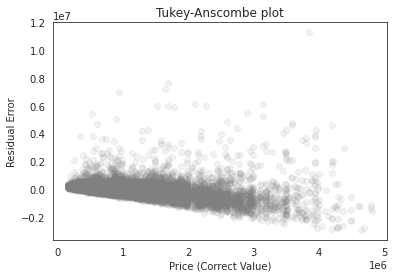

In [16]:
residuen = pred - prepro.y_test
plt.scatter(prepro.y_test, np.array(residuen), alpha = 0.1, color = 'grey')
plt.title("Tukey-Anscombe plot")
plt.xlabel("Price (Correct Value)")
plt.ylabel("Residual Error")
plt.show()

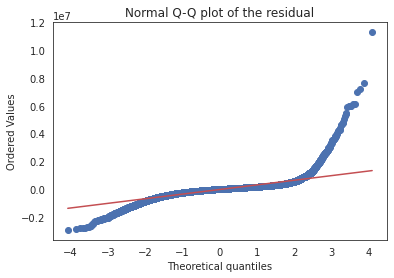

In [17]:
stats.probplot(residuen, dist="norm", plot=plt)
plt.title("Normal Q-Q plot of the residual")
plt.show()

Sieht besser aus. Trotzdem sieht man klar, dass unerklärte Varianz vorhanden ist. Ebenfalls scheint es, als würde unser Model den PurchasePrice sehr oft zu hoch schätzen. Es hat also noch Abweichung, was unser Model nicht erklären kann.

## Feature Selection mit Hilfe von EDA
Im EDA-Teil haben wir gesehen, dass nur wenige Features überhaupt positiv oder negativ mit dem Preis korrelieren. 
Dies bedeutet: wir sollten ein ähnlich gutes Model mit nur wenigen Features herstellen können. Ebenfalls benutzen wir die Attribute,
von denen wir die Korrelation nicht berechnen können, also die "Onehot-encoded"-Attribute.

In [18]:
### Params
min_abs_corr = 0.1
###
csv_data_corr = csv_data.corr(method='spearman')
csv_data_corr_filtered = csv_data_corr[np.abs(csv_data_corr)>min_abs_corr]['PurchasePrice']
list_attributes_affecting_price = csv_data_corr_filtered.dropna().index.to_list()
print("{} Attributes having a Spearman-coefficient above 0.1 with PurchasePrice:".format(len(list_attributes_affecting_price)))
list_attributes_affecting_price

25 Attributes having a Spearman-coefficient above 0.1 with PurchasePrice:


['AreaLiving',
 'AreaProperty',
 'BuiltYear',
 'HouseObject',
 'PopulationDensityL',
 'RealEstateTypeId',
 'Rooms',
 'TravelTimeMiv',
 'WorkplaceDensityL',
 'WorkplaceDensityM',
 'gde_area_nonproductive_percentage',
 'gde_area_settlement_percentage',
 'gde_empty_apartments',
 'gde_foreigners_percentage',
 'gde_politics_bdp',
 'gde_politics_fdp',
 'gde_politics_gps',
 'gde_politics_svp',
 'gde_pop_per_km2',
 'gde_population',
 'gde_private_apartments',
 'gde_tax',
 'gde_workers_sector3',
 'gde_workers_total',
 'PurchasePrice']

In [ ]:
list_attributes_affecting_price.extend(['GroupNameDe'])
list_attributes_affecting_price.extend(['Zip'])
csv_data_filtered = csv_data[list_attributes_affecting_price].copy()
csv_data_filtered['Zip'] = (csv_data_filtered['Zip']/100).astype('int8')
#csv_data_filtered.head()

In [20]:
prepro_filtered = preprocessor(csv_data_filtered, y_var='PurchasePrice', cols_to_drop=[], method_to_encode='onehot_encode', numbers_to_encode=['Zip'])
prepro_filtered.preprocess()

In [21]:
reg = sklearn.linear_model.LinearRegression()
reg.fit(prepro_filtered.X_train, np.log(prepro_filtered.y_train))
pred = np.exp(reg.predict(prepro_filtered.X_test))
r2_mape(prepro_filtered.y_test, pred)

R2-Score: 0.4750141939802949. MAPE: 0.2444058045075745


Mit 42 weniger Attributen (vor Onehot-Encoding) erreichen wir fast dasselbe Ergebnis!

# XGB-Regressor
Man hat bei der Residuenanalyse gesehen, dass die Lineare Regression unerklärbare Varianz hat. Wir müssen also ein anderes Model benutzen. Wir versuchen also einen XGBoost-Regressor. XGBoost steht für eXtreme Gradient Boosting. Es ist also ein Decision-Tree Algorithmus, welcher seine Genauigkeit  mit weiteren Bäumen verbessert. Dies passiert durch das reduzieren einer von uns gewählten Object-Function. Standardmässig nimmt der XGBoost-Regressor den MSE zwischen dem kalkulierten Preis und dem richtigen Preis.

In [22]:
 # Instantiation 
xgb_r = xg.XGBRegressor(seed = 42)
# Fitting the model 
xgb_r.fit(prepro_filtered.X_train.values, np.log(prepro_filtered.y_train.values))
# Predict the model 
pred = np.exp(xgb_r.predict(prepro_filtered.X_test.values))
# Workaround because of dtype issue, so it's not possible to pass a dataframe. This is a workaround to still get column-names to use
# feature importance.y
xgb_r.get_booster().feature_names = prepro_filtered.X_train.columns.to_list()

In [23]:
r2_mape(prepro_filtered.y_test, pred)

R2-Score: 0.8117852093958533. MAPE: 0.16745824960560005


Eine starke Verbesserung! Ohne jegliche Parameteroptimierungen und mit massiv reduzierten Daten. Im nächsten Schritt sehen wir die Wichtigkeit der Attribute.

Die Wichtigkeitstabelle stellt dar, wie wertvoll ein Feature in der Konstruierung des 'Boosted Decision Tree'-Modelles ist: je häufiger ein Attribut für eine Entscheidung genutzt wird, desto höher ist seine relative Wichtigkeit. So können die Attribute sortiert und miteinander verglichen werden.

Die Wichtigkeit wird für einen einzelnen Entscheidungsbaum durch den Wert berechnet, um den jeder Attribut-Aufteilungspunkt das Leistungsmass verbessert – gewichtet nach der Anzahl der Beobachtungen, für die der Knoten verantwortlich ist.

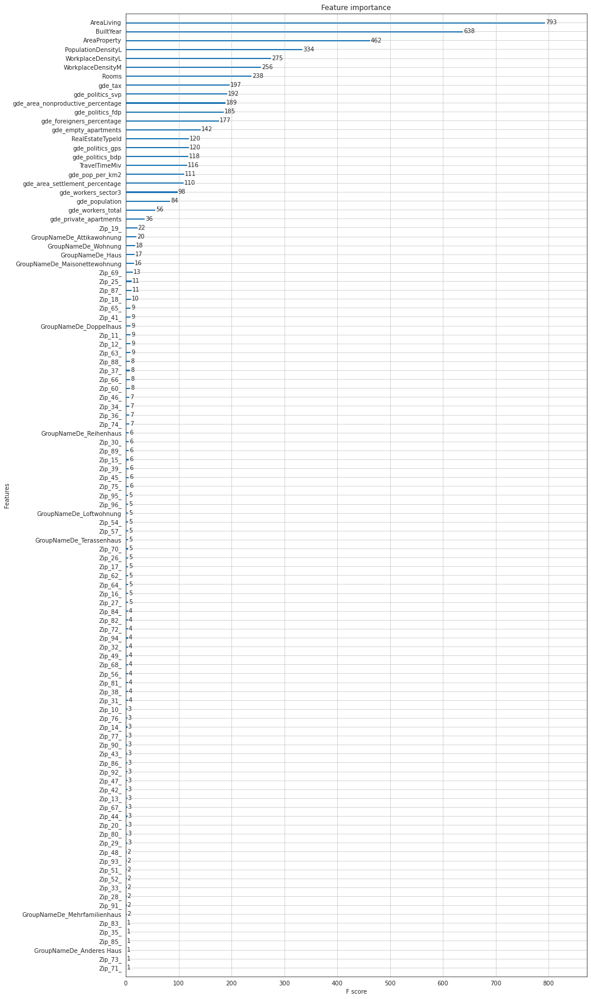

In [24]:
# plot
plt.rcParams["figure.figsize"] = (14, 30)
plot_importance(xgb_r, max_num_features=15)

Das Ergebniss ist akzeptabel. Da es 'Boosted Random Forest Tree' ist, müssen wir die Features nicht notwendigerweise Onehot-encoden. 
Wir können Objekte auch Label-encoden und so RAM einsparen.

In [25]:
prepro = preprocessor(csv_data, y_var='PurchasePrice', method_to_encode='label_encode', cols_to_drop=['Id', 'LastUpdate', 'Locality', 'StreetAndNr'], numbers_to_encode=[], test_frac= 0.1)#, 'Id'])
prepro.preprocess()

/opt/conda/lib/python3.8/site-packages/sklearn/utils/validation.py:72: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(**kwargs)


In [26]:
 # Instantiation 
xgb_r = xg.XGBRegressor(seed = 42)
# Fitting the model 
xgb_r.fit(prepro.X_train.values, np.log(prepro.y_train.values))
# Predict the model 
pred = np.exp(xgb_r.predict(prepro.X_test.values))
# Workaround because of dtype issue, so it's not possible to pass a dataframe. This is a workaround to still get column-names to use
# feature importance.y
xgb_r.get_booster().feature_names = prepro.X_train.columns.to_list()

In [27]:
r2_mape(prepro.y_test, pred)

R2-Score: 0.8228875532196948. MAPE: 0.15948104328521964


Hier nochmals die Wichtigkeit der Attribute:

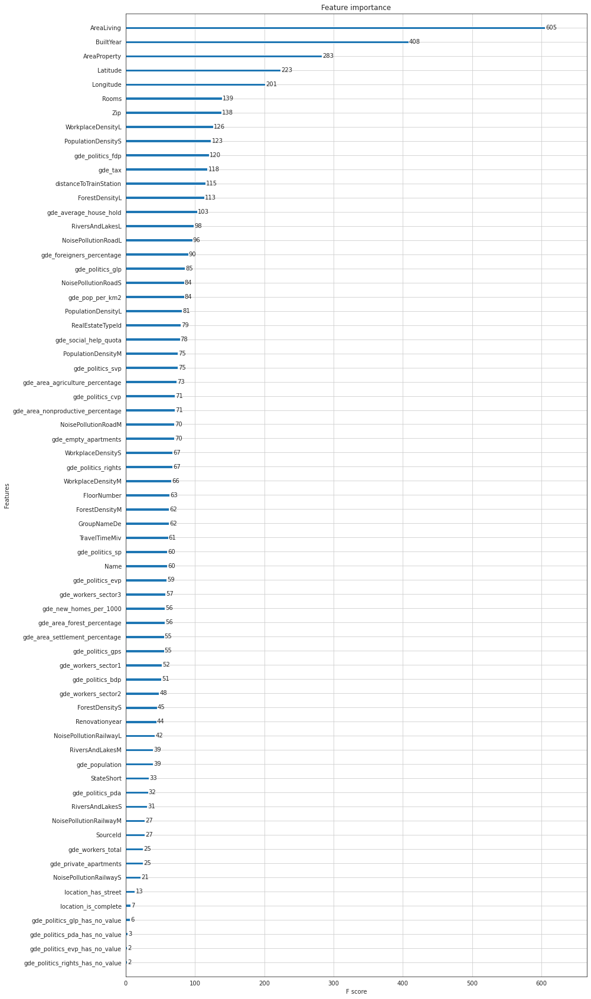

In [28]:
# plot
plt.rcParams["figure.figsize"] = (15, 20)
plot_importance(xgb_r, max_num_features=15)


Sieht schon gut aus! Wir können nun noch die Paramter optimieren!

# Parameteroptimierung von XGBoost mit Hilfe der Bayes'scher Inferenz und Gauß-Prozess

Wie sieht es mit XGB-Regression aus, falls wir Parameter optimieren? Zur Optimierung benutzen wir eine Methode, welche auf Bayes'scher Inferenz und Gauß-Prozess aufbaut und versucht, den Maximalwert einer unbekannten Funktion in so wenigen Iterationen wie möglich zu finden. 

Die Bayes'sche Optimierung funktioniert, indem eine Verteilung von Funktionen (Gauß-Prozess) konstruiert wird, die die zu optimierende Funktion am besten beschreibt. Wenn die Anzahl der Beobachtungen wächst, wird die Verteilung genauer und der Algorithmus wird immer sicherer, welche Regionen im Parameterraum (nicht) wertvoll zu erforschen sind. 

Ebenfalls definieren wir eine neue Objective-Function für den XGBBoost-Regressor. Die Aufgabe war ja, den MAPE zu minimieren. Somit geben wir dem XGBoost Regressor diese Aufgabe und die Bayes'sche Optimierung soll die besten Parameter für einen möglichst niedrigen MAPE-Wert finden. 

Um Bayesian-Optimization durchzuführen, müssen wir zuerst Folgendes machen:
- die Daten vorbereiten,
- eine Funktion beschreiben, welche maximiert werden kann,
- sinnvolle Parameterräume definieren,
- die Anzahl Iterationen definieren und Anzahl Probepunkte.

Ebenfalls machen wir noch etwas Feature-Engineering:
- wir erstellen das Attribut "Sq_per_room", das besagt, wieviel ein Wohnobjekt an Wohnraum pro Raum hat,
- wir teilen die Postleitzahl nicht mehr durch 100, sondern nur noch durch 10 und Onehot-encoden dies,
- wir subtrahieren vom jetztigen Jahr das Baujahr und das Renovationsjahr, da für die Maschine eher interessant ist, wie lange das Bau- bzw. die Renovationjahr her ist.

Folgende Parameter werden optimiert:
- learning_rate: Wie schnell das Model das Gelernte anwendet,
- colsample_bytree: Welche Fraktion der Attribute für die jetztige Iteration benutzt wird. Verhindert/Reduziert Overfitting,
- subsample: Welche Fraktion der Reihen für die jetztige Iteration benutzt wird. Verhindert/Reduziert Overfitting,
- max_depth: Maximale Tiefe des Baumes. Verhindert/Reduziert Overfitting,
- n_estimators: Wieviele Decisiontrees erstellt werden,
- gradient_mult_mape: Parameter für die MAPE-objective Funktion.

Ebenfalls, da Pandas nicht intelligent mit den Typen umgeht, reduzieren wir die Grösse der Daten im Speicher mit der Klasse Reducer.

In [29]:
csv_data_fe = csv_data.copy()
# FE:
csv_data_fe['Zip'] = (csv_data_fe['Zip']/10).astype('int8')
csv_data_fe['Sq_per_room'] = csv_data_fe['AreaLiving'] / csv_data_fe['Rooms']
csv_data_fe['Years_since_renovation'] = 2020 - csv_data_fe['Renovationyear']
csv_data_fe['Years_since_built'] = 2020 - csv_data_fe['BuiltYear']
csv_data_fe['FloorNumber_above_41'] = np.where(csv_data_fe['FloorNumber']>41, True, False)
csv_data_fe['Built_ater_renovation']= np.where(csv_data_fe['BuiltYear']>csv_data_fe['Renovationyear'], True, False)

prepro = preprocessor(csv_data_fe, y_var='PurchasePrice', method_to_encode='onehot_encode', cols_to_drop=['Id', 'LastUpdate', 'Locality', 'StreetAndNr', 'Longitude', 'Latitude'], numbers_to_encode=['Zip'], test_frac= 0.1)#, 'Id'])
prepro.preprocess()
# Reduce Memory-Usage
X_train_reduced = Reducer().reduce(prepro.X_train)
X_test_reduced = Reducer().reduce(prepro.X_test)

reduced df from 112.0678 MB to 73.4443 MB in 18.76 seconds
reduced df from 12.5211 MB to 8.1602 MB in 1.83 seconds


In [ ]:
start = datetime.datetime.now()

def bay_opt_nmape(learning_rate, colsample_bytree, max_depth, n_estimators, subsample, gradient_mult_mape):
    """Function to give back a MAPE-Score to optimise."""
    # Define objective function to minise mape for xgboost:
    def mape_objective_function(y_pred, y_true):
        """
        Function, which gives back the gradient for mape and the hessian matrix.
        """
        y_true = np.log(y_true)
        grad = (y_pred - y_true) / (gradient_mult_mape + y_true * np.abs(y_pred - y_true))
        hess = 0.1 * np.ones(len(y_pred))
        return grad, hess


    ### cast certain inputs to int:
    max_depth = int(max_depth)
    n_estimators = int(n_estimators)
    # Instantiation 
    xgb_r = xg.XGBRegressor(seed = 42, learning_rate = learning_rate, max_depth = max_depth, n_estimators = n_estimators, tree_method = 'hist', subsample = subsample, 
                            colsample_bytree = colsample_bytree, n_jobs = 4, obj_fun=mape_objective_function)
    
    
    # Fitting the model 
    xgb_r.fit(X_train_reduced.values, np.log(prepro.y_train.values))

    # Predict the model 
    pred = np.exp(xgb_r.predict(X_test_reduced.values))

   
    # Current Accuracy.
    return negative_mean_absolute_percentage_error(prepro.y_test, pred)


# Bounded region of parameter space
param_bounds =   {'learning_rate': (0.01, 0.03), 
                'max_depth': (7, 16),
                'subsample' : (0.8, 1), 
                "gradient_mult_mape": (0.1, 0.3),
                'colsample_bytree': [0.3, 1],
                'n_estimators' : (400, 1600)
               }

# Try and Except to continue training incase we don't start from scratch.
try:
    optimizer_xgb
    asdasd
    print("Continuing the optimization.")
    optimizer_xgb.maximize(
        init_points=15,
        n_iter=60,
    )
    
except:
    # Define optimizer
    print("Starting the optimization from scratch.")
    optimizer_xgb = BayesianOptimization(
        f=bay_opt_nmape,
        pbounds=param_bounds,
        random_state=42,
    )

    # Start the optimization
    optimizer_xgb.maximize(
        init_points=15,
        n_iter=60,
    )


print(datetime.datetime.now() - start)

Starting the optimization from scratch.
|   iter    |  target   | colsam... | gradie... | learni... | max_depth | n_esti... | subsample |
-------------------------------------------------------------------------------------------------


In [ ]:
Hier sehen wir alle Iterationen und deren Resultate:

In [ ]:
for i, res in enumerate(optimizer_xgb.res):
    print("Iteration {}: \n\t{}".format(i, res))

In [ ]:
Die besten Parameter:

In [ ]:
print(optimizer_xgb.max)
# Save results to csv:
pd.DataFrame(optimizer_xgb.res).to_csv('param_xgb.csv', index = False)

In [ ]:
Nun können wir das beste Model fitten:

In [19]:
optimizer_xgb_max = dict({'colsample_bytree': 0.6272818843148427, 'learning_rate': 0.01188737813903044, 'max_depth': 17.0, 'n_estimators': 1814.7400053444749, 'subsample': 0.8047530624843426,  'gradient_mult_mape': 0.29})

## FEs
csv_data_fe = csv_data.copy()
csv_data_fe['Zip'] = (csv_data_fe['Zip']/10).astype('int8')
csv_data_fe['Sq_per_room'] = csv_data_fe['AreaLiving'] / csv_data_fe['Rooms']
csv_data_fe['Years_since_renovation'] = 2020 - csv_data_fe['Renovationyear']
csv_data_fe['Years_since_built'] = 2020 - csv_data_fe['BuiltYear']
csv_data_fe['FloorNumber_above_41'] = np.where(csv_data_fe['FloorNumber']>41, True, False)
csv_data_fe['Built_ater_renovation']= np.where(csv_data_fe['BuiltYear']>csv_data_fe['Renovationyear'], True, False)

## Drop wrong rows:
index_impossible_renovation_date = csv_data_fe[csv_data_fe['BuiltYear']>csv_data_fe['Renovationyear']].index
csv_data_fe.drop(index=index_impossible_renovation_date, inplace = True)

prepro = preprocessor(csv_data_fe, y_var='PurchasePrice', method_to_encode='onehot_encode', cols_to_drop=['Id', 'LastUpdate', 'Locality', 'StreetAndNr', 'Longitude', 'Latitude'], numbers_to_encode=['Zip'], 
                        test_frac= 0.1, robust_scaler = True, remove_skew_by_boxcox = False, standardise_number = True, verbose = 0)#, 'Id'])
prepro.preprocess()
# Reduce Memory-Usage
X_train_reduced = Reducer().reduce(prepro.X_train)
X_test_reduced = Reducer().reduce(prepro.X_test)

# Train Model on optimized parameter:
def train_xgb(learning_rate, colsample_bytree, max_depth, n_estimators, subsample, gradient_mult_mape):
        # Define objective function to minise mape for xgboost:
    def mape_objective_function(y_pred, y_true):
        """
        Function, which gives back the gradient for mape and the hessian matrix.
        """
        y_true = np.log(y_true)
        grad = (y_pred - y_true) / (gradient_mult_mape + y_true * np.abs(y_pred - y_true))
        hess = 0.1 * np.ones(len(y_pred))
        return grad, hess

    ### cast certain inputs to int:
    max_depth = int(max_depth)
    n_estimators = int(n_estimators)
    # Instantiation 
    xgb_r = xg.XGBRegressor(seed = 42, learning_rate = learning_rate, max_depth = max_depth, 
                            n_estimators = n_estimators, tree_method = 'hist', subsample = subsample, 
                            colsample_bytree = colsample_bytree, n_jobs = -1, obj_fun=mape_objective_function)
    # Fitting the model 
    xgb_r.fit(X_train_reduced.values, np.log(prepro.y_train.values))

    # Predict the model 
    pred = np.exp(xgb_r.predict(X_test_reduced.values))

    # Mape
    r2_mape(prepro.y_test, pred)
    return xgb_r

#xgb_best = train_xgb(**optimizer_xgb.max['params'])
xgb_best = train_xgb(**optimizer_xgb_max)
xgb_best.save_model('xgb_boost.model')


reduced df from 112.0516 MB to 73.4331 MB in 5.68 seconds
reduced df from 12.5195 MB to 8.1592 MB in 0.50 seconds
R2-Score: 0.8657933058420197. MAPE: 0.12985230216045093


<AxesSubplot:title={'center':'Feature importance'}, xlabel='F score', ylabel='Features'>

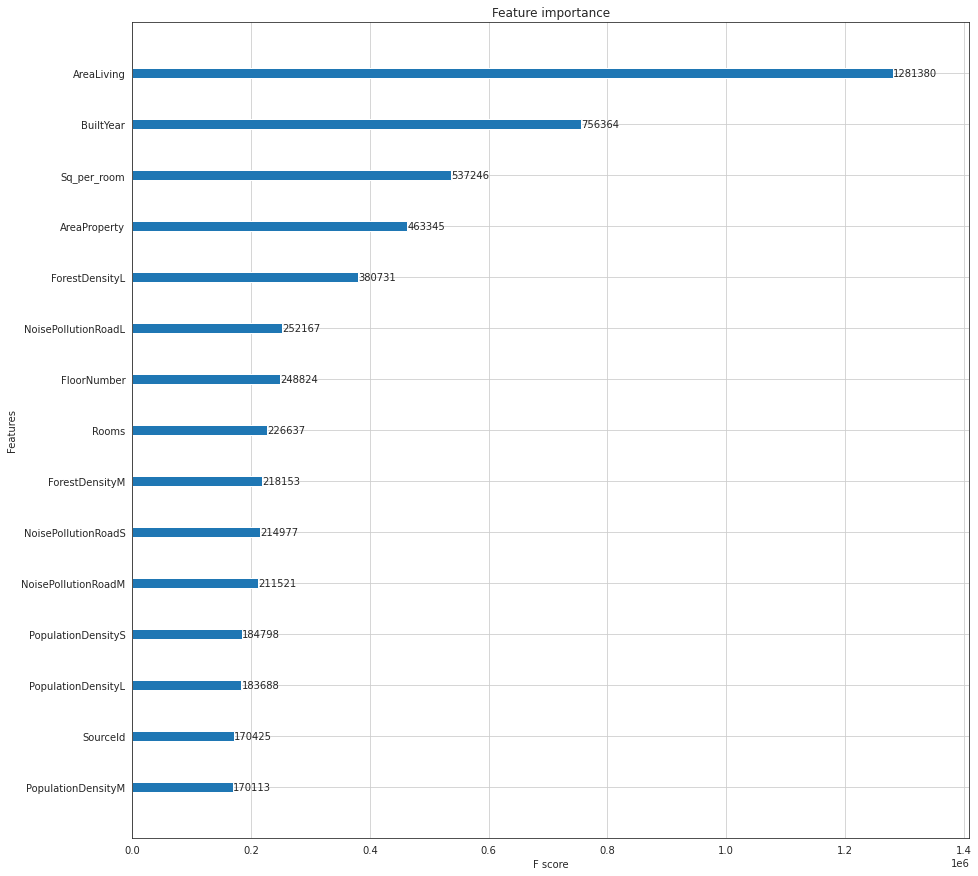

In [27]:
plt.rcParams["figure.figsize"] = (15, 15)
xgb_best.get_booster().feature_names = prepro.X_train.columns.to_list()
plot_importance(xgb_best, max_num_features=15)

## Residuenanalyse
Wir können uns die Residuen vom besten Model anschauen, um zu sehen, ob wir ein Muster in den Residuen entdecken. Dies würde uns sagen, ob wir noch etwas verbessern könnten.

In [28]:
y_hat = np.exp(xgb_best.predict(prepro.X_test))
residuen = prepro.y_test - y_hat

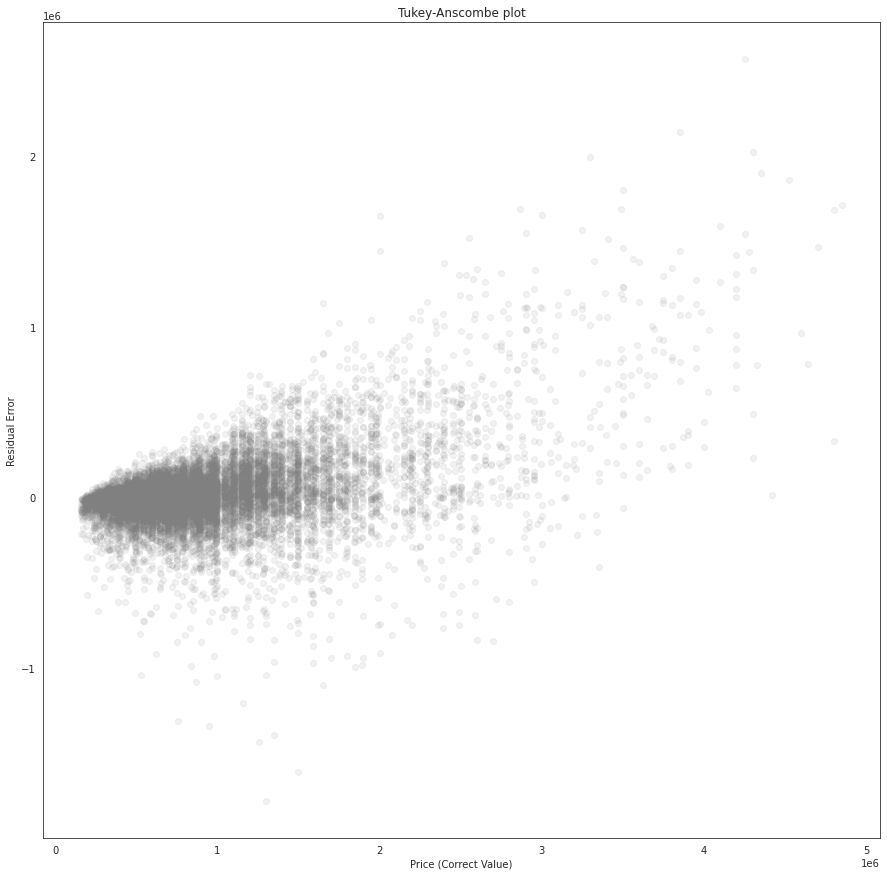

In [33]:
plt.scatter(prepro.y_test, np.array(residuen), alpha = 0.1, color = 'grey')
plt.title("Tukey-Anscombe plot")
plt.xlabel("Price (Correct Value)")
plt.ylabel("Residual Error")
plt.show()


 mu = 22036.34 and sigma = 210183.55



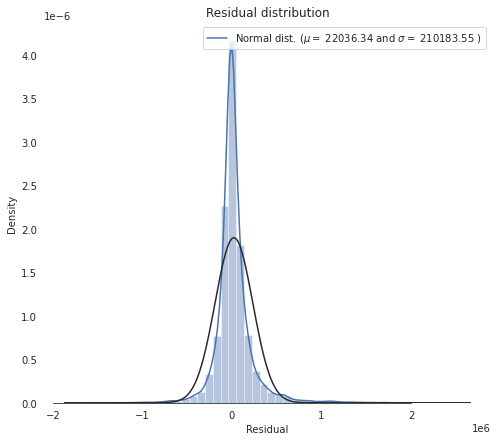

In [38]:
sns.set_style("white")
sns.set_color_codes(palette='deep')
f, ax = plt.subplots(figsize=(8, 7))
#Check the new distribution 
sns.distplot(residuen , fit=norm, color="b")

# Get the fitted parameters used by the function
(mu, sigma) = norm.fit(residuen)
print( '\n mu = {:.2f} and sigma = {:.2f}\n'.format(mu, sigma))

#Now plot the distribution
plt.legend(['Normal dist. ($\mu=$ {:.2f} and $\sigma=$ {:.2f} )'.format(mu, sigma)],
            loc='best')
ax.xaxis.grid(False)
ax.set(ylabel="Density")
ax.set(xlabel="Residual")
ax.set(title="Residual distribution")
sns.despine(trim=True, left=True)

plt.show()

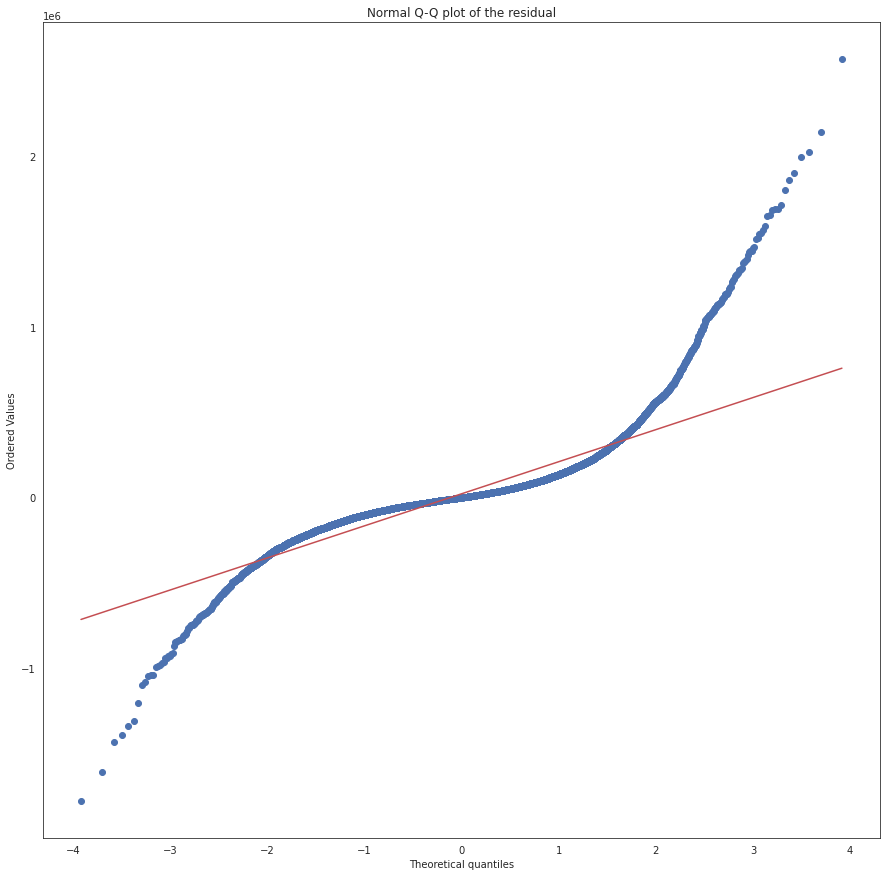

In [35]:
stats.probplot(residuen, dist="norm", plot=plt, lim)
plt.title("Normal Q-Q plot of the residual")
plt.show()

In [37]:
 durbin_watson(residuen, prepro.y_test)

1.4326169109577225

Wir haben bei den Residuen gesehen, dass es besser ist. Es ist aber noch abzulesen, dass die Varianz mit der grösste des Purchase-Price zunimmt. Es hat also noch unerklärte Varianz. Dies sieht man auch bei durbin_watson; Ein Wert um 2 wäre perfekt.

# Hochladen des Test-Sets auf Kaggle
Da wir nun das bestmögliche Model gefunden haben, können wir die Preise kalkulieren und diese auf Kaggle hochladen:

In [ ]:
# Test-Set laden:
test_df = pd.read_csv('test.csv')
# FE durchführen:
test_df['Zip'] = (test_df['Zip']/10).astype('int8')
test_df['Sq_per_room'] = test_df['AreaLiving'] / test_df['Rooms']
test_df['Years_since_renovation'] = 2020 - test_df['Renovationyear']
test_df['Years_since_built'] = 2020 - test_df['BuiltYear']
test_df['FloorNumber_above_41'] = np.where(test_df['FloorNumber']>41, True, False)
test_df['Built_ater_renovation']= np.where(test_df['BuiltYear']>test_df['Renovationyear'], True, False)

# Unterschiedliche Datentypen und Values verändern zum Training-Dataset.
test_df['HouseObject'] = test_df['HouseObject'].astype('bool')
test_df['AreaProperty'] = np.where(test_df['AreaProperty'].isna(), 0, test_df['AreaProperty'])

# Dataframe für den Upload erstellen:
submission = pd.DataFrame(columns=['Expected'], index = test_df['Id'])
test_df_prepro = prepro.encode_sample(test_df, test_data=True)

# Vorraussage erstellen:
submission['Expected'] = np.exp(xgb_best.predict(test_df_prepro.values).reshape(-1, 1))
submission.to_csv('submission.csv',header=True)

# LGBM-Regressor
Wir sehen, dass das Model von XGBoost sehr gross wird (600 MB +) und die Trainingszeit sehr lange ist (15 Minuten). Da ist der LGBM-Regressor bestimmt interessant, da er in der Leistung ähnlich ist, aber bekannterweise schneller trainiert wird und ein kleineres Modell besitzt. Im Gegensatz dazu, braucht der LGBM-Regressor pro Fit ca. 20 Sekunden und das Model ist mit etwa 60MM rund 10 Mal kleiner. Leider ist auch der MAPE mit ungefähr 13.2% fast ein halbes Prozent schlechter. Die viel schnellere Laufzeit und das viel kleinere Model macht LGBM trotzdem zu einer sehr attraktiven Alternative. 

In [ ]:
## FEs
csv_data_fe = csv_data.copy()
csv_data_fe['Zip'] = (csv_data_fe['Zip']/10).astype('int8')
csv_data_fe['Sq_per_room'] = csv_data_fe['AreaLiving'] / csv_data_fe['Rooms']
csv_data_fe['Years_since_renovation'] = 2020 - csv_data_fe['Renovationyear']
csv_data_fe['Years_since_built'] = 2020 - csv_data_fe['BuiltYear']

## Drop wrong rows:
index_impossible_renovation_date = csv_data_fe[csv_data_fe['BuiltYear']>csv_data_fe['Renovationyear']].index
csv_data_fe.drop(index=index_impossible_renovation_date, inplace = True)

prepro = preprocessor(csv_data_fe, y_var='PurchasePrice', method_to_encode='onehot_encode', cols_to_drop=['Id', 'LastUpdate', 'Locality', 'StreetAndNr', 'Longitude', 'Latitude'], numbers_to_encode=['Zip'], 
                        test_frac= 0.1, robust_scaler = True, remove_skew_by_boxcox = False, standardise_number = True, verbose = 1)#, 'Id'])
prepro.preprocess()
# Reduce Memory-Usage
X_train_reduced = Reducer().reduce(prepro.X_train)
X_test_reduced = Reducer().reduce(prepro.X_test)

def bay_opt_nmape(num_leaves, max_depth, min_child_samples, min_child_weight, subsample, colsample_bytree, reg_alpha, reg_lambda, num_iterations, learning_rate ):
    ### cast certain inputs to int:
    num_leaves = int(num_leaves)
    min_child_samples = int(min_child_samples)
    max_depth = int(max_depth)
    num_iterations = int(num_iterations)
    # Instantiation 
    lgb_r = lgb.LGBMRegressor(num_leaves = num_leaves, 
                                max_depth = max_depth, 
                                min_child_samples = min_child_samples, 
                                min_child_weight = min_child_weight, 
                                subsample = subsample, 
                                colsample_bytree = colsample_bytree,
                                reg_alpha = reg_alpha, 
                                reg_lambda = reg_lambda,
                                objective = 'mape',
                                num_iterations = num_iterations,
                                learning_rate = learning_rate)
    # Fitting the model 
    lgb_r.fit(prepro.X_train.values, np.log(prepro.y_train.values), early_stopping_rounds=10, 
             eval_set=[(prepro.X_test.values, np.log(prepro.y_test.values))], eval_metric = 'mape', verbose = 0)
    # Predict the model 
    pred = np.exp(lgb_r.predict(prepro.X_test.values))

    return negative_mean_absolute_percentage_error(prepro.y_test, pred)


# Bounded region of parameter space
param_bounds ={'num_leaves': (80, 300), 
    	       'max_depth':(27, 40),
               'min_child_samples': (100, 500), 
               'min_child_weight': (1e-5, 1e4),
               'subsample': (0.8, 0.99), 
               'colsample_bytree': (0.8, 0.99),
               'reg_alpha': (0, 100),
               'objective': (0.1, 0.2),
               'reg_lambda': (0,  100),
               'num_iterations' : (250, 1000),
               'learning_rate': (0.01, 0.3)}


optimizer = BayesianOptimization(
    f=bay_opt_nmape,
    pbounds=param_bounds,
    random_state=42,
)
optimizer.maximize(
    init_points=25,
    n_iter=150,
)

print(datetime.datetime.now() - start)
